# Imports, environment initialization, and agent file names

In [1]:
from collections import namedtuple
from kaggle_environments import make
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
import pickle
import seaborn as sns
from scipy import stats
from tqdm import tqdm
%matplotlib inline

env = make('mab', debug=True)

RANDOM = 'handcrafted_agents/random_agent.py'
ALWAYS_FIRST = 'handcrafted_agents/always_first_agent.py'
SAMPLE_UCB = 'handcrafted_agents/sample_ucb_agent.py'
UCB_DECAY = 'ucb_decay.py'
BASIC_BAYESIAN_UCB = 'handcrafted_agents/basic_bayesian_ucb.py'
BAYESIAN_UCB_WITH_ACTION_HISTORY = 'handcrafted_agents/bayesian_ucb_with_action_history.py'
BASIC_THOMPSON_SAMPLING = 'handcrafted_agents/basic_thompson_sampling.py'
THOMPSON_SAMPLING_WITH_ACTION_HISTORY = 'handcrafted_agents/thompson_sampling_with_action_history.py'
GREEDY_THOMPSON_SAMPLING_WITH_ACTION_HISTORY = 'ahandcrafted_agentsgents/greedy_thompson_sampling_with_action_history.py'
DISCRETE_THOMPSON_SAMPLING = 'handcrafted_agents/discrete_thompson_sampling.py'
DISCRETE_THOMPSON_SAMPLING_WITH_ACTION_HISTORY = 'handcrafted_agents/discrete_thompson_sampling_with_action_history.py'
THOMPSON_SAMPLING_WITH_OPPONENT_SIMULATION = 'handcrafted_agents/thompson_sampling_with_opponent_simulation.py'

Loading environment football failed: No module named 'gfootball'


# Custom comparison functions

In [2]:
class SimViz:
    
    def __init__(self, sims=None):
        
        # Copy simulations to object
        if sims:
            self.sims = {name:env for name,env in sims.items()}
            # Get simulation environments (JSON)
            self.envs = {k:self.get_env_json(env) for k,env in self.sims.items()}
        else:
            self.sims = {}
            self.envs = {}
            
    def get_env_json(self, env):
        try:
            env_json = env.toJSON()
            return env_json
        except:
            print('ERROR: Invalid environment')
            
    def add_env(self, env, name=None):
        # TODO: Make sure it is a unique name
        if name is None:
            name =  f'{len(self.envs) + 1}'
            name += f'_{"".join(k[-1] for k in self.envs.keys())}'
        # Add to both sims and envs
        self.sims[name] = env
        self.envs[name] = self.get_env_json(env)
        
    def add_sim(self, env, name=None):
        # TODO: Make sure it is a unique name
        if name is None:
            name =  f'{len(self.sims) + 1}'
            name += f'_{"".join(k[-1] for k in self.sims.keys())}'
        # Add to both sim and env
        self.sims[name] = env
        self.add_env(env, name)
            

    def get_rewards(self, name):
        # TODO:  Check for error
        agent_steps = self.envs.get(name).get('steps')
        n_steps = len(agent_steps)
        rewards0 = [agent_steps[s][0].get('reward') for s in range(n_steps)]
        rewards1 = [agent_steps[s][1].get('reward') for s in range(n_steps)]
        return rewards0, rewards1
    
    def plot_total_reward(self, names=None, *args, **kwargs):
        fig,ax = plt.subplots()
        fig.suptitle('Total Rewards Over Steps')
        ax.set_xlabel('Steps')
        ax.set_ylabel('Rewards (cummulative)')
        if names is None:
            names = list(self.envs.keys())
        elif not isinstance(names, list):
            names = [names]
        
        # Plot all the simulations given
        for name in names:
            rewards0, rewards1 = self.get_rewards(name)
            ax.plot(rewards0, label='agent_0', *args, **kwargs)
            ax.plot(rewards1, label='agent_1', *args, **kwargs)
            ax.plot(np.abs(np.array(rewards1) - np.array(rewards0)), label='reward_delta', *args, **kwargs)
        ax.legend()

        return fig, ax

# New agent

In [3]:
n_bandits = 1
sample_res = 100
decay_rate = 0.97
posteriors = np.ones((n_bandits, sample_res+1)) / (sample_res+1)
thresholds = np.repeat(
    np.arange(sample_res+1, dtype=np.float64)[None, :],
    n_bandits,
    axis=0
)

EV = []
Rs = []

true_payout_init = 50.
true_payout = true_payout_init
bandit = 0
rewards = [0.] * 5 + [1.] * 5
for i in range(len(rewards)):
    #r = float(np.random.randint(sample_res) < true_payout)
    r = float(rewards[i])
    Rs.append(r)
    
    likelihood = ((np.ceil(thresholds[bandit]) / sample_res) ** r) * ((1 - np.ceil(thresholds[bandit]) / sample_res) ** (1 - r))
    posteriors[bandit] = posteriors[bandit] * likelihood
    posteriors[bandit] = posteriors[bandit] / posteriors[bandit].sum()
    
    thresholds[bandit] = thresholds[bandit] * decay_rate
    true_payout *= decay_rate
    
    EV.append((thresholds[bandit] * (posteriors / posteriors.sum(axis=1, keepdims=True))).sum() / 100.)
print(f'Mean actual reward: {np.mean(Rs):.2f}')
#print(f'Mean expected reward: {np.maximum((true_payout_init / 100.) * 0.97 ** np.arange(1, len(Rs)+1), 0.01).mean():.2f}')
print(f'Estimated EV at final step: {EV[-1]:.2f}')
#print(f'True EV at final step: {true_payout / 100.:.2f}')

Mean actual reward: 0.50
Estimated EV at final step: 0.39


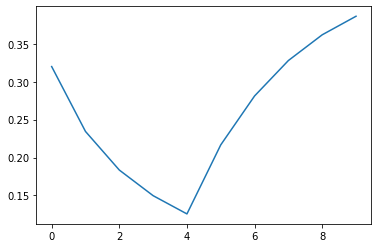

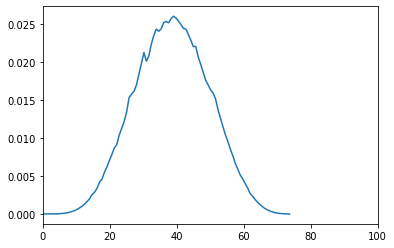

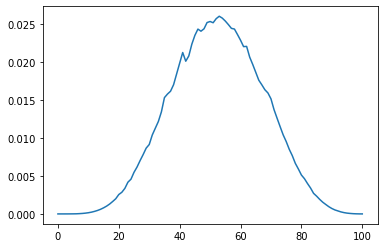

In [4]:
plt.plot(EV)
plt.show()

plt.plot(thresholds[bandit], posteriors[bandit])
plt.xlim(0, 100);
plt.show()

plt.plot(posteriors[bandit])
plt.show();

# Simulations

## Run locally step-by-step:

In [145]:
from importlib import reload
from handcrafted_agents import always_first_agent, basic_thompson_sampling, thompson_sampling_with_opponent_simulation, random_agent, pull_vegas_slot_machines, discrete_bayesian_mixed
reload(discrete_bayesian_mixed)

Configuration = namedtuple('Configuration', env.__dict__['configuration'].keys())
Observation = namedtuple('Observation', ['agentIndex', 'lastActions', 'step', 'reward'])

env.reset();
last_actions = None
config = Configuration(**env.__dict__['configuration'])

#agent_0 = basic_thompson_sampling
agent_0.post_a = None
agent_0.post_b = None
agent_0.bandit = None
agent_0.total_reward = 0
agent_0 = pull_vegas_slot_machines
#agent_0 = always_first_agent
agent_0.bandit_dict = {}
#opp_sim_agent = thompson_sampling_with_opponent_simulation
#opp_sim_agent.curr_agent = None
agent_1 = discrete_bayesian_mixed
agent_1.curr_agent = None
agents = [agent_0.agent, agent_1.agent]
best_thresholds = []
selected_thresholds = []
reward_history = []

In [146]:
for step in tqdm(range(1000)):
    observations = [Observation(
        agentIndex=i,
        lastActions=env.state[0]['observation']['lastActions'],
        step=env.state[0]['observation']['step'],
        reward=env.state[i]['reward']
    ) for i in range(2)]
    reward_history.append([env.state[i]['reward'] for i in range(2)])
    actions = [agents[i](observations[i], config) for i in range(2)]
    #print(actions)
    best_thresholds.append(np.max(env.state[0]['observation']['thresholds']))
    selected_thresholds.append([env.state[0]['observation']['thresholds'][act] for act in actions])
    env.step(actions)
best_thresholds = np.array(best_thresholds) / 100.
selected_thresholds = np.array(selected_thresholds) / 100.
observations

100%|██████████| 1000/1000 [00:02<00:00, 395.83it/s]


[Observation(agentIndex=0, lastActions=[70, 58], step=999, reward=445),
 Observation(agentIndex=1, lastActions=[70, 58], step=999, reward=472)]

In [143]:
np.stack([np.array(agent_1.curr_agent.opp_act_history[:-1]), np.array(agent_1.curr_agent.est_opp_r_history), np.diff(np.array(reward_history)[:-1,0])], axis=-1)

array([[49. ,  0. ,  1. ],
       [ 0. ,  1. ,  1. ],
       [ 0. ,  1. ,  1. ],
       ...,
       [80. ,  0.3,  1. ],
       [80. ,  0.8,  0. ],
       [80. ,  0. ,  0. ]])

In [147]:
np.mean(np.abs(np.array(agent_1.curr_agent.est_opp_r_history) - np.diff(np.array(reward_history)[:-1,0])))

0.3275150300601202

In [140]:
np.mean(np.abs(np.array(agent_1.curr_agent.est_opp_r_history) - np.diff(np.array(reward_history)[:-1,0])))

0.4657314629258517

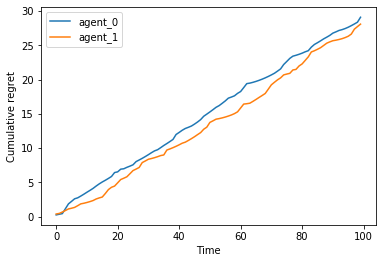

In [114]:
agent_0_regret = best_thresholds - selected_thresholds[:,0]
agent_1_regret = best_thresholds - selected_thresholds[:,1]

plt.plot(np.cumsum(agent_0_regret), label='agent_0')
plt.plot(np.cumsum(agent_1_regret), label='agent_1')
plt.xlabel('Time')
plt.ylabel('Cumulative regret')
plt.legend();

In [52]:
# True current posteriors
my_evs = agent_1.curr_agent.get_evs(agent_1.curr_agent.my_posteriors, agent_1.curr_agent.thresholds)
# Estimated opponent posteriors
est_opp_evs = agent_1.curr_agent.get_evs(agent_1.curr_agent.my_belief_opp_posteriors, agent_1.curr_agent.last_thresholds)
# Estimate of opponent's estimated agent posteriors
est_opp_est_my_evs = agent_1.curr_agent.get_evs(agent_1.curr_agent.opp_belief_my_posteriors, agent_1.curr_agent.last_thresholds)
my_evs

array([0.48151684, 0.48151684, 0.48151684, 0.6499    , 0.48151684,
       0.48151684, 0.70918582, 0.5       , 0.5       , 0.5       ,
       0.55572674, 0.5       , 0.5       , 0.5       , 0.5       ,
       0.5       , 0.5       , 0.5       , 0.5       , 0.5       ,
       0.5       , 0.5       , 0.5       , 0.5       , 0.5       ,
       0.5       , 0.5       , 0.5       , 0.5       , 0.5       ,
       0.5       , 0.5       , 0.5       , 0.5       , 0.5       ,
       0.5       , 0.5       , 0.5       , 0.5       , 0.5       ,
       0.5       , 0.5       , 0.5       , 0.5       , 0.5       ,
       0.5       , 0.5       , 0.5       , 0.5       , 0.5       ,
       0.5       , 0.5       , 0.5       , 0.5       , 0.5       ,
       0.5       , 0.5       , 0.5       , 0.5       , 0.5       ,
       0.5       , 0.5       , 0.5       , 0.5       , 0.5       ,
       0.5       , 0.5       , 0.5       , 0.5       , 0.5       ,
       0.5       , 0.5       , 0.5       , 0.5       , 0.5    

In [10]:
print(agent_1.get_evs(agent_1.curr_agent.TEMP_my_last_posteriors, agent_1.curr_agent.last_thresholds) - est_opp_est_my_evs)
my_evs, est_opp_est_my_evs

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0.]


(array([48.5       , 47.045     , 50.        , 50.        , 50.        ,
        50.        , 50.        , 50.        , 50.        , 50.        ,
        50.        , 50.        , 50.        , 50.        , 50.        ,
        50.        , 50.        , 50.        , 50.        , 50.        ,
        50.        , 50.        , 50.        , 50.        , 50.        ,
        50.        , 50.        , 50.        , 50.        , 50.        ,
        50.        , 50.        , 50.        , 50.        , 50.        ,
        50.        , 50.        , 50.        , 50.        , 50.        ,
        50.        , 50.        , 50.        , 50.        , 50.        ,
        50.        , 50.        , 50.        , 50.        , 50.        ,
        50.        , 50.        , 50.        , 50.        , 50.        ,
        50.        , 50.        , 50.        , 50.        , 50.        ,
        50.        , 50.        , 50.        , 50.        , 50.        ,
        50.        , 50.        , 50.        , 48.1

NameError: name 'base_agent' is not defined

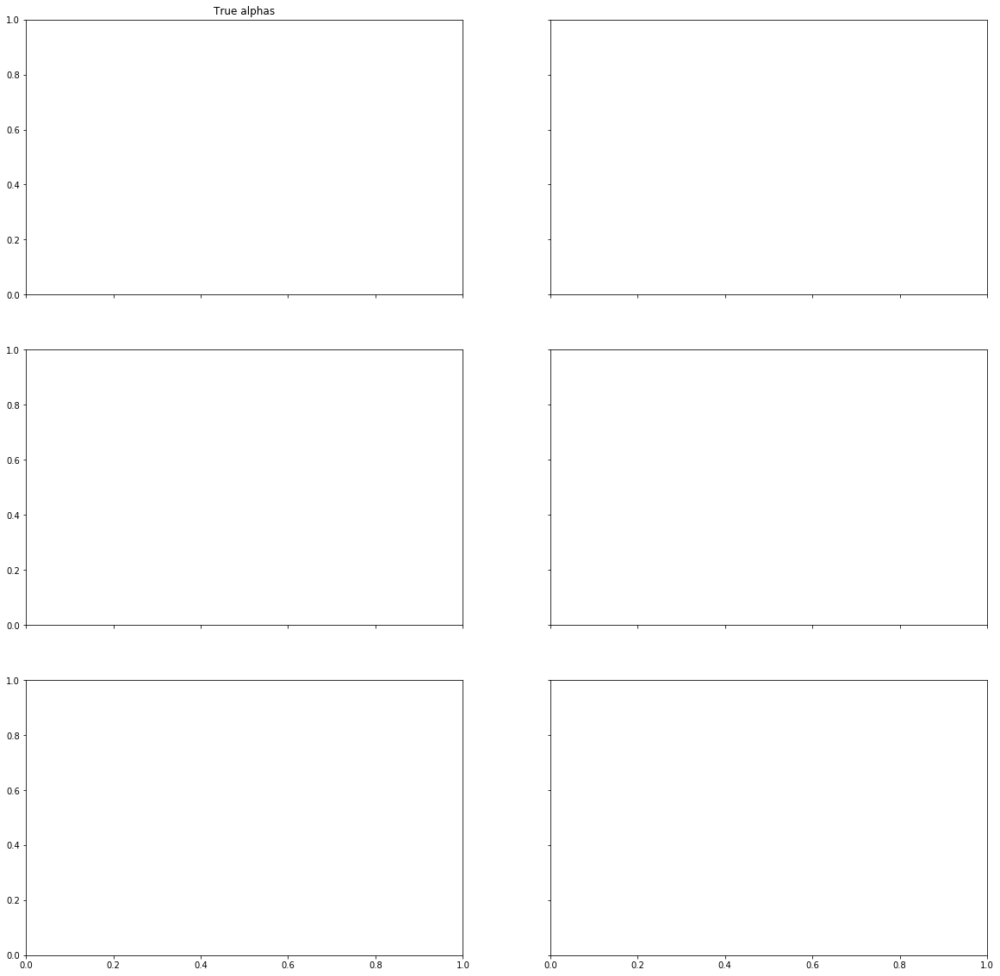

In [18]:
fig, axes = plt.subplots(
    3, 2,
    sharex=True, sharey=True,
    figsize=(20,20)
)

# Draw alpha heatmaps
axes[0,0].set_title('True alphas')
sns.heatmap(base_agent.post_a.reshape((10,10)), ax=axes[0,0],
            vmin=1, vmax=np.max(base_agent.post_a), annot=True)
axes[1,0].set_title('Estimated alphas')
sns.heatmap(opp_sim_agent.curr_agent.est_opp_post_a.reshape((10,10)), ax=axes[1,0],
            vmin=1, vmax=np.max(base_agent.post_a), annot=True)
axes[2,0].set_title('Difference between true and estimated alphas - mean {:.2f}'.format(
    np.abs(base_agent.post_a - opp_sim_agent.curr_agent.est_opp_post_a).mean()
))
sns.heatmap(np.abs(np.around(base_agent.post_a - opp_sim_agent.curr_agent.est_opp_post_a, 2)).reshape((10,10)), ax=axes[2,0],
            vmin=0, annot=True)

# Draw beta heatmaps
axes[0,1].set_title('True betas')
sns.heatmap(base_agent.post_b.reshape((10,10)), ax=axes[0,1],
            vmin=1, vmax=np.max(base_agent.post_b), annot=True)
axes[1,1].set_title('Estimated betas')
sns.heatmap(opp_sim_agent.curr_agent.est_opp_post_b.reshape((10,10)), ax=axes[1,1],
            vmin=1, vmax=np.max(base_agent.post_b), annot=True)
axes[2,1].set_title('Difference between true and estimated betas - mean {:.2f}'.format(
    np.abs(base_agent.post_b - opp_sim_agent.curr_agent.est_opp_post_b).mean()
))
sns.heatmap(np.abs(np.around(base_agent.post_b - opp_sim_agent.curr_agent.est_opp_post_b, 2)).reshape((10,10)), ax=axes[2,1],
            vmin=0, annot=True)

None

In [258]:
env.reset()
#print(env.__dict__['state'][0]['observation']['thresholds'][0])
env.run(['handcrafted_agents/greedy_discrete_bayesian_agent.py', 'handcrafted_agents/greedy_discrete_bayesian_agent.py'])
#env.run([RANDOM, DISCRETE_THOMPSON_SAMPLING_WITH_ACTION_HISTORY])
env.render(mode='ipython', width=800, height=500)

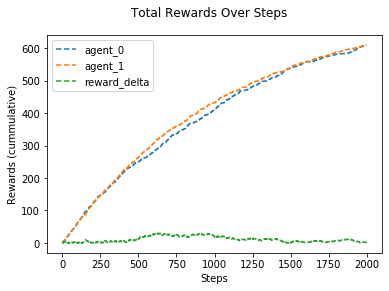

In [259]:
test = SimViz(dict(env=env))
f, ax = test.plot_total_reward(linestyle='dashed')

# Misc

Agent observation structure, as of 12/11/20: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 0, 'step': 0, 'lastActions': [5, 7]}

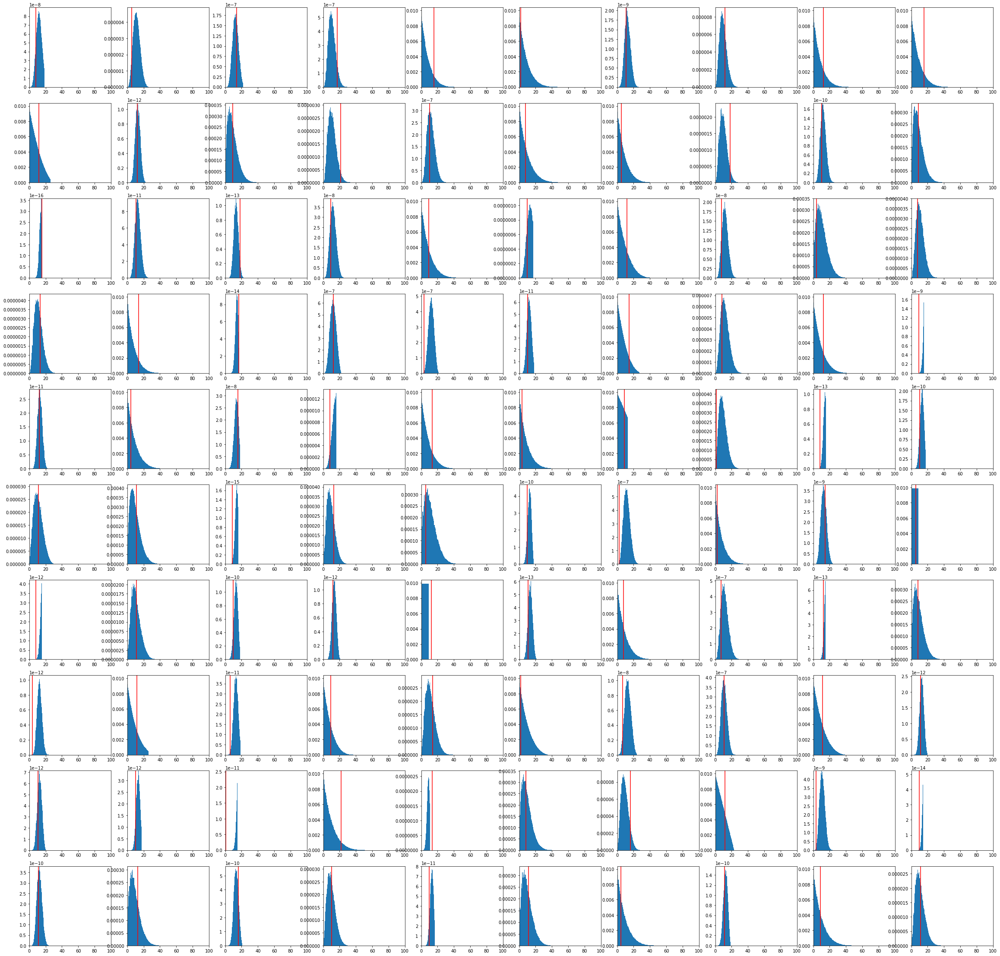

In [250]:
with open('log.pkl', 'rb') as f:
    posteriors_list, thresholds_list = pickle.load(f)

fig, axes = plt.subplots(10, 10, figsize=(40,40))

final_posteriors = posteriors_list[-1]
final_thresholds = thresholds_list[-1]
for i in range(100):
    ax = axes[i // 10, i % 10]
    posterior = final_posteriors[i]
    thresholds = final_thresholds[i]
    ax.bar(thresholds, posterior, width=max(thresholds) / 100)
    ax.axvline(env.__dict__['state'][0]['observation']['thresholds'][i], color='r')
    ax.set_xlim(0,100)

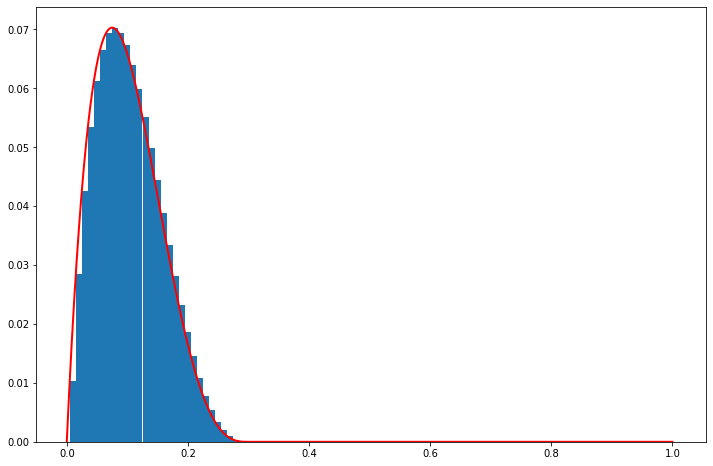

In [21]:
#sample_res = env.configuration.sampleResolution
sample_res = 100
beta_kwargs = dict(
    a=np.array([1,1,1,2]).reshape((-1,1)),
    b=np.array([1,2,3,4]).reshape((-1,1)),
    scale=np.array([0.2, 0.2, 0.3, 0.3]).reshape((-1,1))
)
discretized_posteriors = beta.cdf((np.arange(sample_res) + 1) / sample_res, **beta_kwargs) - beta.cdf(np.arange(sample_res) / sample_res, **beta_kwargs)
#np.random.choice(np.arange())
discretized_posteriors
# See threshold distributions
fig, ax = plt.subplots(1,1, figsize=(12,8))
target_idx = 3
bar_target = discretized_posteriors[target_idx]
ax.bar((np.arange(len(bar_target)) + 1.) / sample_res, bar_target, width=1 / (sample_res+1));
ax.plot(np.linspace(0,1,1000), beta.pdf(np.linspace(0,1,1000), **beta_kwargs)[target_idx] / sample_res, color='r', linewidth=2);

In [303]:
# This is not quite precise - there is too much uncertainty in the posterior about the potential upper limits of the post-decay reward likelihood
def update_prior_v1(a, b, decay=0.5):
    n_samples = a + b
    expectation = decay * a / (a + b)
    new_a = n_samples * expectation
    new_b = n_samples - n_samples * expectation
    return new_a, new_b

def update_prior_v2(a, b, decay=0.5):
    n_samples = a + b
    expectation = decay * a / (a + b)
    new_a = n_samples * expectation
    new_b = n_samples - n_samples * expectation
    return new_a, new_b

a: 1.6199999999999997, b: 1.3800000000000003
Standard deviation-based estimated upper bound:	 1.038
Beta ppf at 0.98:				 0.962


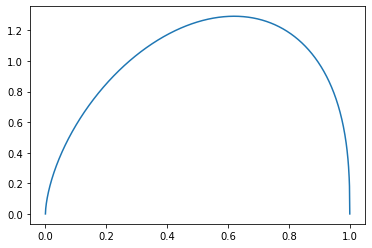

In [311]:
a, b = update_prior_v1(2, 1, decay=0.9)
a, b = update_prior_v1(a, b, decay=0.9)
#a = 1
#b = 1
print(f'a: {a}, b: {b}')
print(f'Standard deviation-based estimated upper bound:\t {beta.stats(a, b, moments="m") + beta.std(a, b) * 2:.3f}')
ppf_val = 0.98.astype(np.float64)
print(f'Beta ppf at {ppf_val}:\t\t\t\t {beta.ppf(ppf_val, a, b):.3f}')

#x = np.linspace(beta.ppf(0.01, a, b), beta.ppf(0.99, a, b), 1000)
x = np.linspace(0, 1, 1000)
#fig, ax = plt.subplots(1, 1, figsize=(10,10))
plt.plot(x, beta.pdf(x, a, b));

In [104]:
env.reset()
min(env.__dict__['state'][0]['observation']['thresholds']), max(env.__dict__['state'][0]['observation']['thresholds'])

(0, 100)

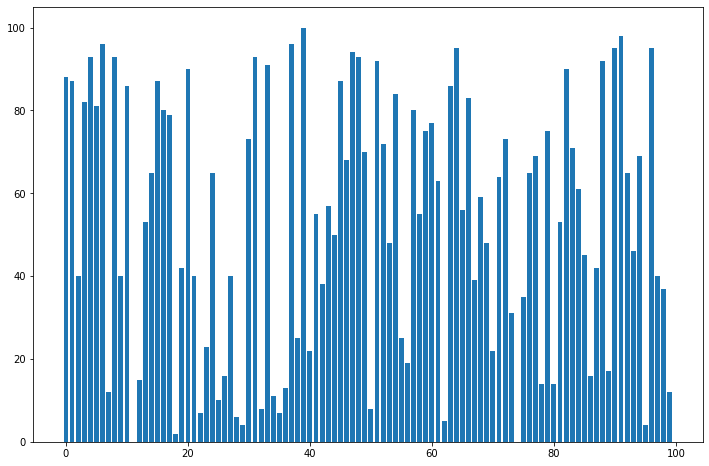

In [105]:
# See threshold distributions
fig, ax = plt.subplots(1,1, figsize=(12,8))
ax.bar(np.arange(env.configuration['banditCount']), env.__dict__['state'][0]['observation']['thresholds']);